In [1]:
import scanpy as sc
import infercnvpy as cnv
import matplotlib.pyplot as plt
import warnings
import pandas as pd
warnings.simplefilter("ignore")
import omicverse as ov
ov.plot_set()


   ____            _     _    __                  
  / __ \____ ___  (_)___| |  / /__  _____________ 
 / / / / __ `__ \/ / ___/ | / / _ \/ ___/ ___/ _ \ 
/ /_/ / / / / / / / /__ | |/ /  __/ /  (__  )  __/ 
\____/_/ /_/ /_/_/\___/ |___/\___/_/  /____/\___/                                              

Version: 1.6.11, Tutorials: https://omicverse.readthedocs.io/
Dependency error: The 'phate>=1.0' distribution was not found and is required by the application


In [2]:
sc.logging.print_header()

scanpy==1.10.4 anndata==0.11.3 umap==0.5.7 numpy==1.26.4 scipy==1.11.4 pandas==2.2.3 scikit-learn==1.6.1 statsmodels==0.14.4 igraph==0.11.8 pynndescent==0.5.13


In [3]:
adata = sc.read("/home/lugli/spuccio/Projects/SP039/GBmap/RawData.h5ad")

In [4]:
adata.shape

(638365, 16345)

In [5]:
adata.obs.head()

,donor_id,Author,stage,assay,tissue,Cells,Method,n_genes,nUMIs,annotation_level_1,...,scsa_celltype_cellmarker,scsa_celltype_panglaodb,cell_type,S_score,G2M_score,phase,leiden,cnv_leiden,cnv_score,cnv_status
Cell1,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,1217,1649.492065,Neoplastic,...,Astrocyte,Neural Stem/Precursor Cells,malignant cell,-0.346103,-0.145763,G1,2,12,0.012155,normal
Cell2,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,2227,1636.858887,Neoplastic,...,Oligodendrocyte,Neurons,malignant cell,-0.107018,-0.188411,G1,8,9,0.030704,tumor
Cell3,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,869,1436.748291,Neoplastic,...,Oligodendrocyte,Neurons,malignant cell,-0.196478,0.199244,G2M,5,4,0.026711,tumor
Cell4,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,2809,2174.696289,Neoplastic,...,Oligodendrocyte,Neurons,malignant cell,0.667687,0.146567,S,8,9,0.030704,tumor
Cell5,ndGBM-01,Abdelfattah2022,Primary,10x 3' v3,frontal lobe,Total,cell,1735,1866.502686,Non-neoplastic,...,Oligodendrocyte,Oligodendrocytes,oligodendrocyte,-0.530942,-0.117756,G1,12,17,0.022981,tumor


In [6]:
adata=ov.pp.preprocess(adata,mode='shiftlog|pearson',
                       n_HVGs=2000,batch_key="Author")
adata

Begin robust gene identification
After filtration, 16326/16345 genes are kept.     Among 16326 genes, 15452 genes are robust.
End of robust gene identification.
Begin size normalization: shiftlog and HVGs selection pearson
normalizing counts per cell. The following highly-expressed genes are not considered during normalization factor computation:
['APOD', 'BPTF', 'CD74', 'CLDN5', 'CST3', 'CXCL3', 'CYB5D2', 'FOS', 'FTH1', 'FTL', 'GFAP', 'GINM1', 'HBB', 'HSPA1A', 'HSPA6', 'JCHAIN', 'MT-CO1', 'MT-CO2', 'MT-CO3', 'MT2A', 'RSRP1', 'SAT1', 'SEC61G', 'SPP1', 'TAX1BP1', 'TIMP1', 'TMSB4X', 'VIM']
    finished (0:00:08)
extracting highly variable genes
--> added
    'highly_variable', boolean vector (adata.var)
    'highly_variable_rank', float vector (adata.var)
    'highly_variable_nbatches', int vector (adata.var)
    'highly_variable_intersection', boolean vector (adata.var)
    'means', float vector (adata.var)
    'variances', float vector (adata.var)
    'residual_variances', float vector

AnnData object with n_obs × n_vars = 638365 × 15452
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'log1p', 'hvg'
    obsm: 'X_cnv', 'X_harmony', 'X_pca', 'X_umap', 'scaled|original|X_pca'
    layers: 'counts'

In [7]:
adata.raw = adata

In [8]:
adata = adata[:, adata.var.highly_variable_features]
adata

View of AnnData object with n_obs × n_vars = 638365 × 2000
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'log1p', 'hvg'
    obsm: 'X_cnv', 'X_harmony', 'X_pca', 'X_umap', 'scaled|original|X_pca'
    layers: 'counts'

In [9]:
ov.pp.scale(adata)
ov.pp.pca(adata,layer='scaled',n_pcs=50)
adata.obsm['X_pca']=adata.obsm['scaled|original|X_pca']

... as `zero_center=True`, sparse input is densified and may lead to large memory consumption
computing PCA
    with n_comps=50
    finished (0:01:41)


In [10]:
adata_ref = adata[(adata.obs['Method'].isin(['cell'])) & (~adata.obs['scsa_celltype_panglaodb'].isin(['Unknown'])) & (~adata.obs['Author'].isin(['Carenza2023']))]

In [11]:
adata = adata[(~adata.obs['Method'].isin(['cell'])) | (adata.obs['scsa_celltype_panglaodb'].isin(['Unknown'])) | (adata.obs['scsa_celltype_cellmarker'].isin(['Unknown'])) | (adata.obs['Author'].isin(['Carenza2023']))]

In [12]:
list(adata_ref[:,adata_ref.var['highly_variable_features'].isin([True])].var.index)

['A2M',
 'AATK',
 'ABCA1',
 'ABCA2',
 'ABCA8',
 'ABCB1',
 'ABCG2',
 'ABI3',
 'ABI3BP',
 'ABL2',
 'ABLIM1',
 'ACAN',
 'ACKR3',
 'ACP5',
 'ACSL1',
 'ACTA2',
 'ACTB',
 'ACTG2',
 'ACTN1',
 'ACTN2',
 'ACY3',
 'ADAM19',
 'ADAM28',
 'ADAM8',
 'ADAMDEC1',
 'ADAMTS1',
 'ADAMTS17',
 'ADAMTS4',
 'ADAMTS6',
 'ADAMTS9',
 'ADAP2',
 'ADARB2',
 'ADCYAP1',
 'ADGRD1',
 'ADGRE2',
 'ADGRE5',
 'ADGRF5',
 'ADGRG1',
 'ADGRG3',
 'ADGRL2',
 'ADGRL3',
 'ADGRL4',
 'ADGRV1',
 'ADIRF',
 'ADM',
 'ADORA3',
 'ADRB2',
 'AEBP1',
 'AGT',
 'AHNAK',
 'AIF1',
 'AIF1L',
 'AK5',
 'AKAP12',
 'AKAP13',
 'AKNA',
 'AKR1C1',
 'AKR1C3',
 'ALCAM',
 'ALDH1A1',
 'ALDH1L1',
 'ALDOC',
 'ALOX15B',
 'ALOX5AP',
 'AMER2',
 'ANG',
 'ANGPT2',
 'ANGPTL4',
 'ANK3',
 'ANKH',
 'ANKRD18A',
 'ANKRD22',
 'ANKRD28',
 'ANKRD33B',
 'ANKRD37',
 'ANKRD44',
 'ANKS1B',
 'ANLN',
 'ANO9',
 'ANPEP',
 'ANXA1',
 'ANXA2',
 'AOAH',
 'AP1B1',
 'APBB1IP',
 'APLN',
 'APLNR',
 'APLP1',
 'APOBEC3G',
 'APOBEC3H',
 'APOBR',
 'APOC1',
 'APOC2',
 'APOD',
 'APOE',
 'APOLD

<AxesSubplot: title={'center': 'Author'}, xlabel='X_pca1', ylabel='X_pca2'>

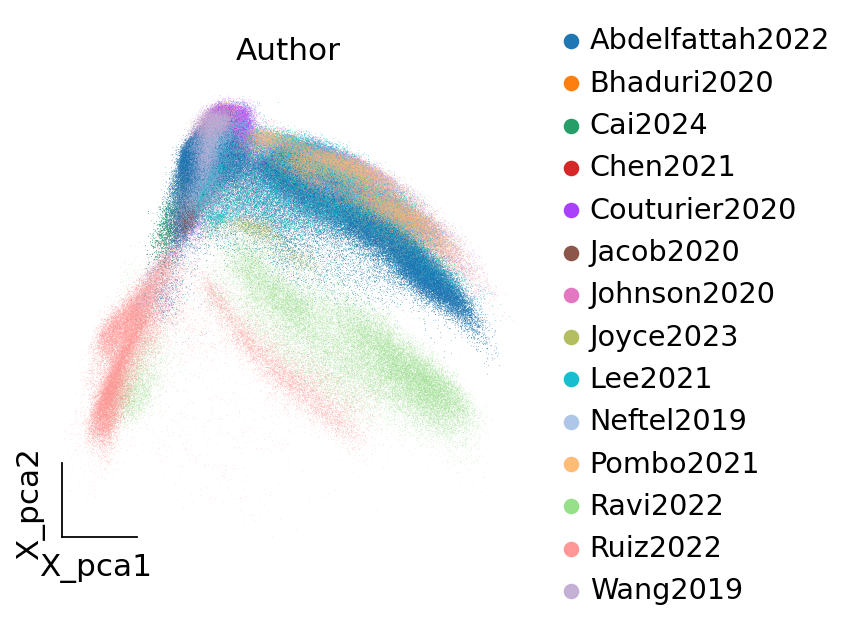

In [13]:
ov.utils.embedding(adata_ref,
                basis='X_pca',frameon='small',
                color=['Author'],show=False,wspace=0.5)

<AxesSubplot: title={'center': 'cell_type'}, xlabel='X_pca1', ylabel='X_pca2'>

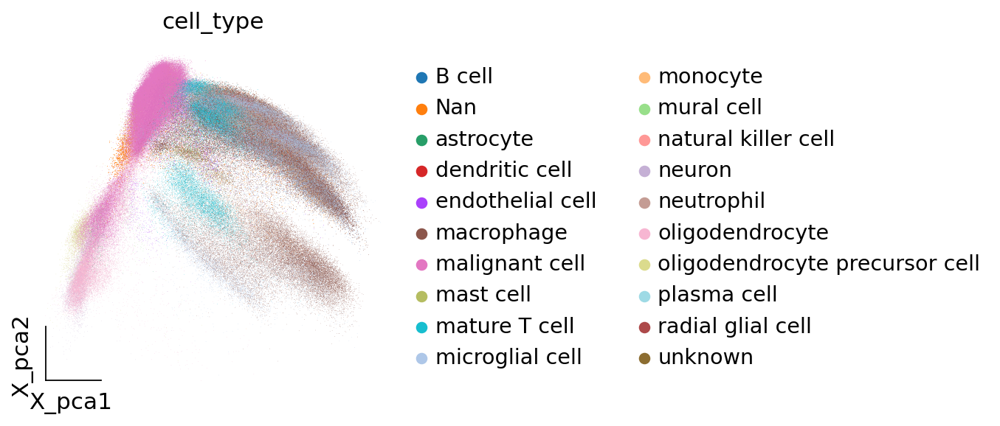

In [14]:
ov.utils.embedding(adata_ref,
                basis='X_pca',frameon='small',
                color=['cell_type'],show=False,wspace=0.5)

In [15]:
adata_ref.obs['Author'].value_counts()

Author
Abdelfattah2022    222578
Couturier2020       46250
Lee2021             45960
Ravi2022            40436
Ruiz2022            39124
Pombo2021           27000
Johnson2020         21476
Jacob2020           20968
Neftel2019          17414
Cai2024             15950
Bhaduri2020         14594
Wang2019            10659
Chen2021             4804
Joyce2023            2176
Name: count, dtype: int64

In [16]:
ov.pp.neighbors(adata_ref, n_neighbors=15, n_pcs=50,
               use_rep='scaled|original|X_pca')


computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:38)


In [17]:
%%time
ov.pp.umap(adata_ref)


computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:20:10)
CPU times: user 2h 46min 23s, sys: 2h 32min 33s, total: 5h 18min 56s
Wall time: 20min 10s


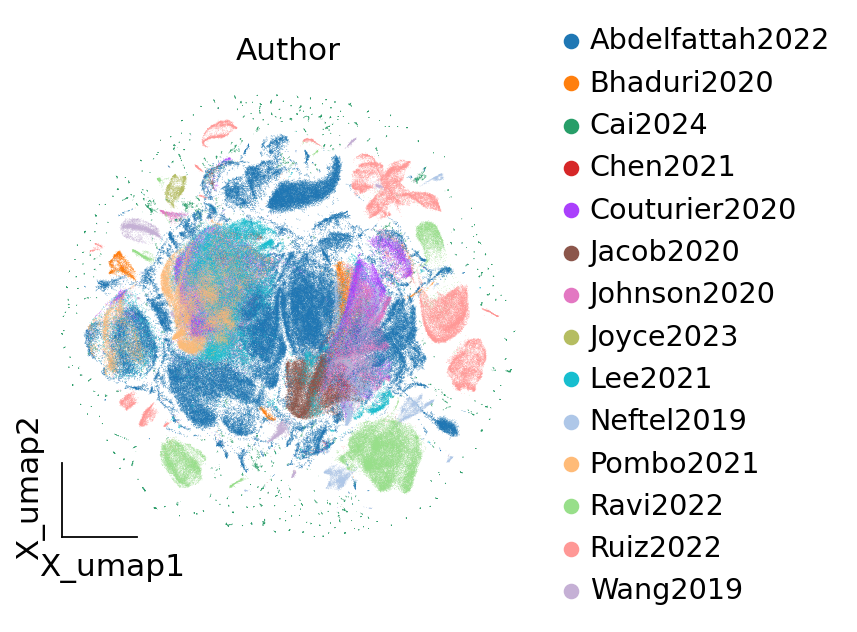

In [18]:
ov.pl.embedding(adata_ref,
                basis='X_umap',
                color='Author',
                frameon='small')

In [19]:
ov.single.batch_correction(adata_ref,batch_key=['Author','assay'],
                                        methods='harmony',n_pcs=30)
adata

...Begin using harmony to correct batch effect


2025-04-24 15:25:10,581 - harmonypy - INFO - Computing initial centroids with sklearn.KMeans...
2025-04-24 15:25:40,033 - harmonypy - INFO - sklearn.KMeans initialization complete.
2025-04-24 15:25:42,413 - harmonypy - INFO - Iteration 1 of 10
2025-04-24 15:30:07,574 - harmonypy - INFO - Iteration 2 of 10
2025-04-24 15:34:32,437 - harmonypy - INFO - Iteration 3 of 10
2025-04-24 15:38:58,034 - harmonypy - INFO - Converged after 3 iterations


View of AnnData object with n_obs × n_vars = 109131 × 2000
    obs: 'donor_id', 'Author', 'stage', 'assay', 'tissue', 'Cells', 'Method', 'n_genes', 'nUMIs', 'annotation_level_1', 'annotation_level_2', 'annotation_level_3', 'scsa_celltype_cellmarker', 'scsa_celltype_panglaodb', 'cell_type', 'S_score', 'G2M_score', 'phase', 'leiden', 'cnv_leiden', 'cnv_score', 'cnv_status'
    var: 'ensembl_gene_id', 'start_position', 'end_position', 'chromosome_name', 'gene_biotype', 'n_cells', 'percent_cells', 'robust', 'means', 'variances', 'residual_variances', 'highly_variable_rank', 'highly_variable_nbatches', 'highly_variable_intersection', 'highly_variable_features'
    uns: 'log1p', 'hvg', 'pca', 'scaled|original|pca_var_ratios', 'scaled|original|cum_sum_eigenvalues'
    obsm: 'X_cnv', 'X_harmony', 'X_pca', 'X_umap', 'scaled|original|X_pca'
    varm: 'PCs', 'scaled|original|pca_loadings'
    layers: 'counts', 'scaled'

In [20]:
adata_ref.obsm['X_harmony'].shape

(529389, 50)

In [21]:
#adata.obsm['X_pca'] = adata.obsm['X_harmony']

In [22]:
ov.pp.neighbors(adata_ref, n_neighbors=15, n_pcs=50,
               use_rep='X_harmony')

computing neighbors
    finished: added to `.uns['neighbors']`
    `.obsp['distances']`, distances for each pair of neighbors
    `.obsp['connectivities']`, weighted adjacency matrix (0:01:27)


In [23]:
%%time
ov.pp.umap(adata_ref)

computing UMAP
    finished: added
    'X_umap', UMAP coordinates (adata.obsm)
    'umap', UMAP parameters (adata.uns) (0:10:22)
CPU times: user 43min 41s, sys: 27min 33s, total: 1h 11min 15s
Wall time: 10min 22s


In [24]:
#adata = adata[~adata.obs['scsa_celltype_cellmarker'].isin(['Unknown']),:]

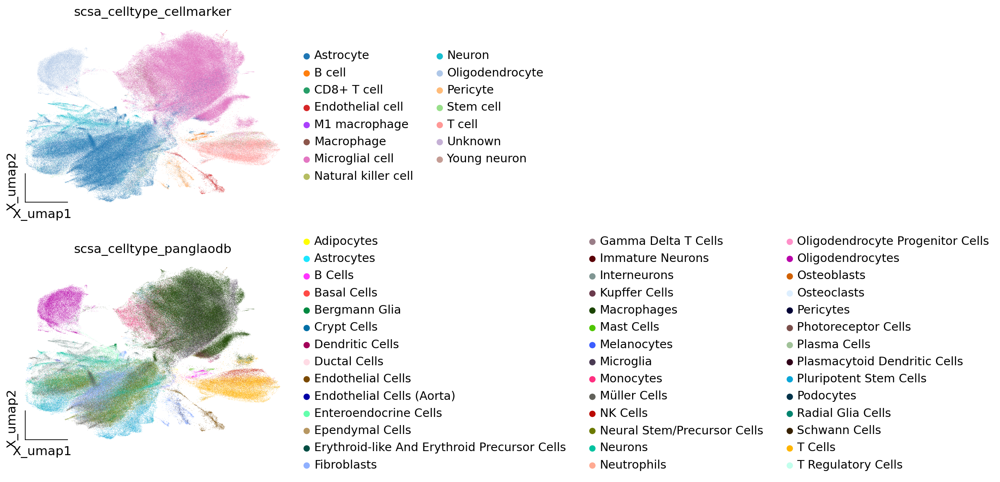

In [25]:
ov.pl.embedding(adata_ref,
                basis='X_umap',
                color=['scsa_celltype_cellmarker','scsa_celltype_panglaodb'],wspace=0.5,ncols=1,
                frameon='small')

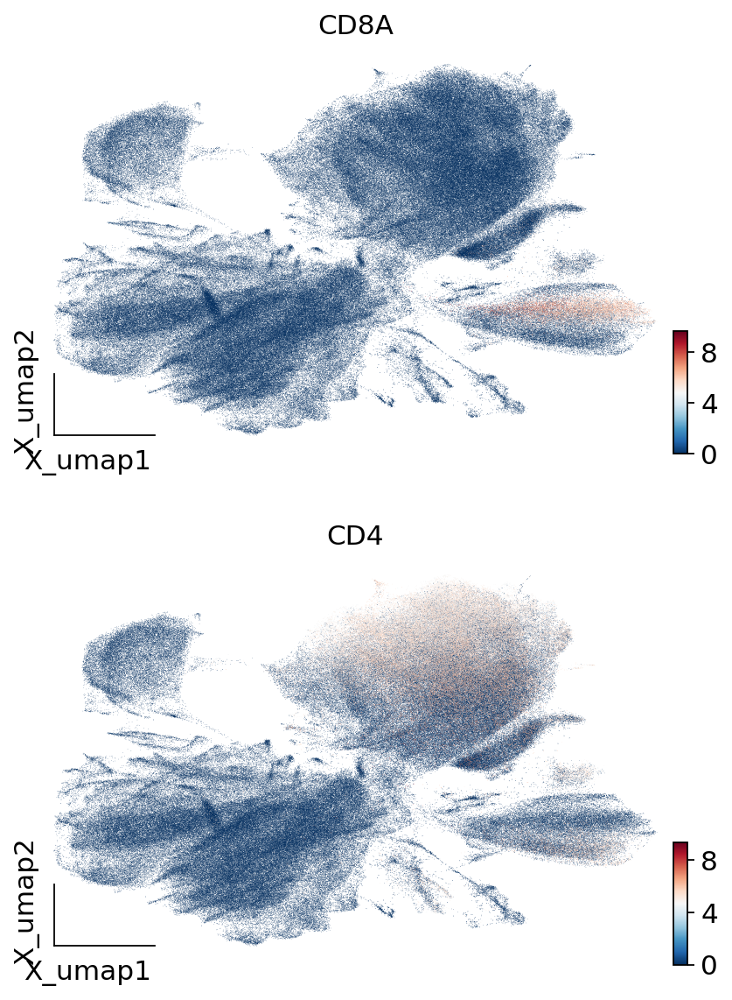

In [26]:
ov.pl.embedding(adata_ref,
                basis='X_umap',
                color=['CD8A','CD4'],wspace=0.5,ncols=1,
                frameon='small')

In [27]:
adata_ref.obs['cnv_status']

Cell1         normal
Cell2          tumor
Cell3          tumor
Cell4          tumor
Cell5          tumor
               ...  
Cell638361       NaN
Cell638362       NaN
Cell638363       NaN
Cell638364       NaN
Cell638365       NaN
Name: cnv_status, Length: 529389, dtype: category
Categories (2, object): ['normal', 'tumor']

In [28]:
import numpy as np
adata_ref.obs['cnv_status'] = adata_ref.obs['cnv_status'].fillna('normal')


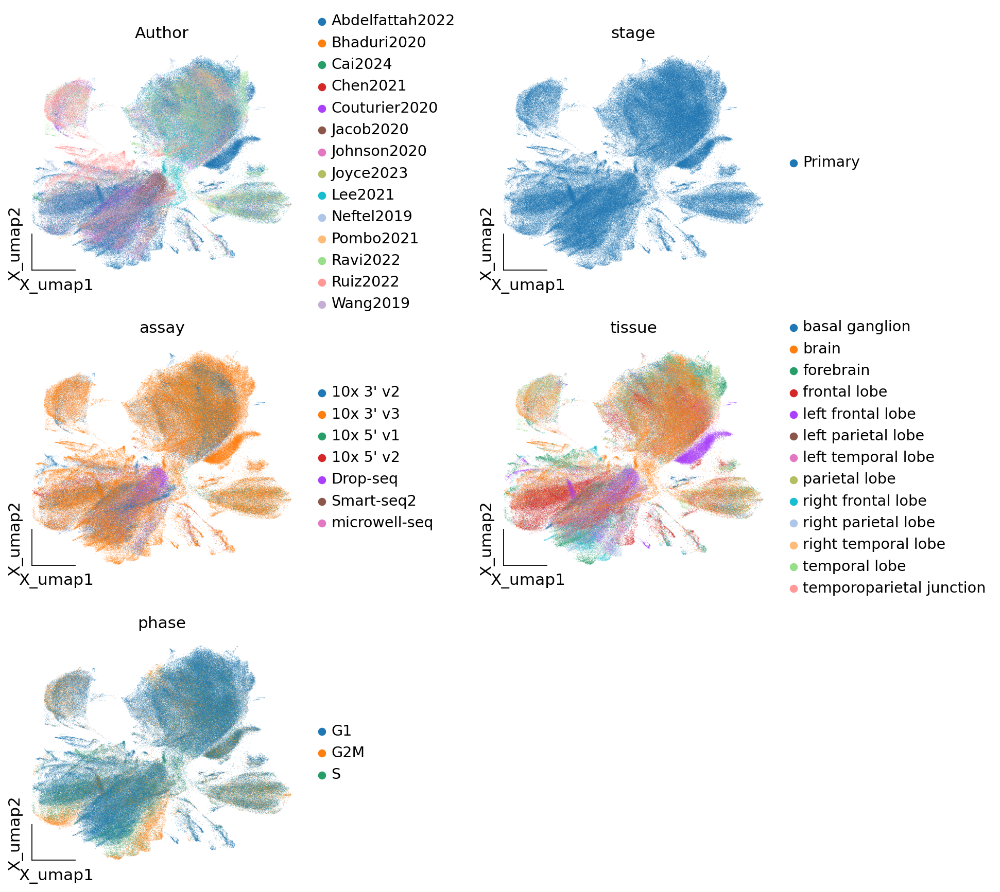

In [29]:
ov.pl.embedding(adata_ref,
                basis='X_umap',
                color=['Author','stage','assay','tissue','phase'],wspace=0.5,ncols=2,
                frameon='small')

In [30]:
#adata.write("/home/lugli/spuccio/Projects/SP039/GBmap/RawDataAfterIntegrationHarmonyWithoutCarenza.h5ad")

In [31]:
adata.shape

(109131, 2000)

In [32]:
adata_ref.shape

(529389, 2000)

In [33]:
sc.tl.ingest(adata, adata_ref, obs="scsa_celltype_cellmarker")

running ingest
    finished (0:01:45)


In [35]:
adata.uns["scsa_celltype_cellmarker_colors"] = adata_ref.uns["scsa_celltype_cellmarker_colors"]

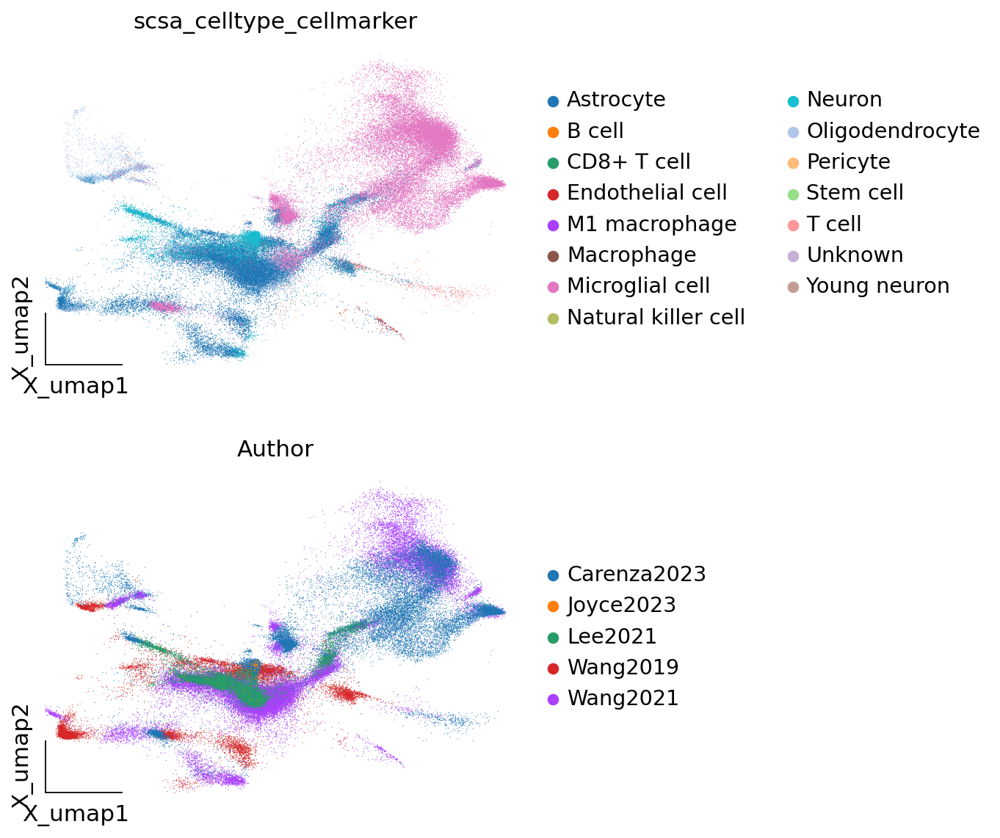

In [38]:
ov.pl.embedding(adata,
                basis='X_umap',
                color=['scsa_celltype_cellmarker','Author'],wspace=0.5,ncols=1,
                frameon='small')

In [40]:
import anndata
adata_concat = anndata.concat([adata_ref, adata], label="batch2", keys=["ref", "new"])

In [82]:
adata_concat = adata_concat[~adata_concat.obs['scsa_celltype_cellmarker'].isin(['Unknown']),:]

In [2]:
adata_concat=sc.read("/home/lugli/spuccio/Projects/SP039/GBmap/AllCellIntegrated.h5ad")

In [3]:
list(adata_concat.obs['scsa_celltype_cellmarker'].unique())

['Astrocyte',
 'Oligodendrocyte',
 'T cell',
 'Microglial cell',
 'Pericyte',
 'Neuron',
 'B cell',
 'Endothelial cell',
 'Stem cell',
 'M1 macrophage',
 'Young neuron',
 'Macrophage',
 'Natural killer cell',
 'CD8+ T cell']

In [4]:
tmp = {'Astrocyte':'Astrocyte',
 'Oligodendrocyte':'Oligodendrocyte',
 'T cell':'T cell',
 'Microglial cell':'Microglial cell',
 'Pericyte':'Pericyte',
 'Neuron':'Neuron',
 'B cell':'B cell',
 'Endothelial cell':'Endothelial cell',
 'Stem cell':'Stem cell',
 'M1 macrophage':'Macrophage',
 'Young neuron':'Neuron',
 'Macrophage':'Macrophage',
 'Natural killer cell':'Natural killer cell',
 'CD8+ T cell':'T cell'
}

In [5]:
adata_concat.obs['scsa_celltype_cellmarker'] = adata_concat.obs['scsa_celltype_cellmarker'].map(tmp)

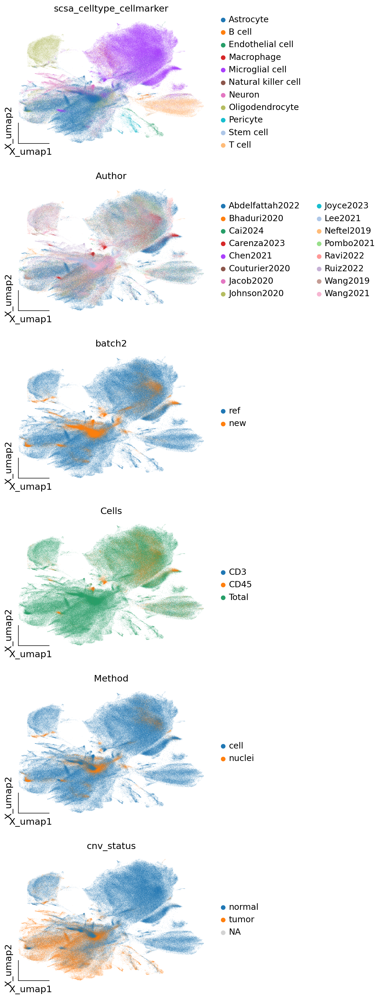

In [6]:
ov.pl.embedding(adata_concat,
                basis='X_umap',
                color=['scsa_celltype_cellmarker','Author','batch2','Cells','Method','cnv_status'],wspace=0.5,ncols=1,
                frameon='small')

In [7]:
adata_concat.write("/home/lugli/spuccio/Projects/SP039/GBmap/AllCellIntegrated.h5ad")